# Convolutional Neural Networks

## Project: Write an Algorithm for a Dog Identification App 

---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the Jupyter Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to **File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains _optional_ "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. If you decide to pursue the "Stand Out Suggestions", you should include the code in this Jupyter notebook.



---
### Why We're Here 

In this notebook, you will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of your finished project (... but we expect that each student's algorithm will behave differently!). 

![Sample Dog Output](images/sample_dog_output.png)

In this real-world setting, you will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  Your imperfect solution will nonetheless create a fun user experience!

### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Write your Algorithm
* [Step 6](#step6): Test Your Algorithm

---
<a id='step0'></a>
## Step 0: Import Datasets

Make sure that you've downloaded the required human and dog datasets:
* Download the [dog dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip).  Unzip the folder and place it in this project's home directory, at the location `/dogImages`. 

* Download the [human dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/lfw.zip).  Unzip the folder and place it in the home directory, at location `/lfw`.  

*Note: If you are using a Windows machine, you are encouraged to use [7zip](http://www.7-zip.org/) to extract the folder.*

In the code cell below, we save the file paths for both the human (LFW) dataset and dog dataset in the numpy arrays `human_files` and `dog_files`.

In [1]:
import numpy as np
from glob import glob

# load filenames for human and dog images
human_files = np.array(glob("lfw/*/*"))
dog_files = np.array(glob("dogImages/*/*/*"))

# print number of images in each dataset
print('There are %d total human images.' % len(human_files))
print('There are %d total dog images.' % len(dog_files))

There are 13233 total human images.
There are 8351 total dog images.


In [7]:
import os

print(len(glob("dogImages/valid/*/*")))

835


## Step 1: Detect Humans
In this section, we use OpenCV's implementation of Haar feature-based cascade classifiers to detect human faces in images.

OpenCV provides many pre-trained face detectors, stored as XML files on github. We have downloaded one of these detectors and stored it in the haarcascades directory. In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

In [8]:
! ls haarcascades/

haarcascade_frontalface_alt.xml


Number of faces detected: 1


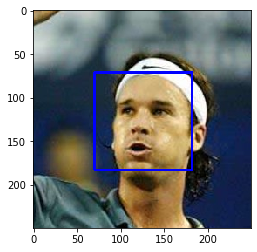

In [13]:
import cv2                
import matplotlib.pyplot as plt                        
%matplotlib inline                               

# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

# load color (BGR) image
img = cv2.imread(human_files[0])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

In [38]:
print(faces)

[[ 70  71 112 112]]


In [37]:
# viewing the raw img converted to greyscale

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [14]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  You will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

__Answer:__ 
(You can print out your results and/or write your percentages in this cell)

- Percentage True Positive: 	 1.0
- Percentage False Positive: 	 0.12    (Dogs with "human faces")

See analysis below

In [93]:
from tqdm import tqdm

human_files_short = human_files[:100]
dog_files_short = dog_files[:100]

#-#-# Do NOT modify the code above this line. #-#-#

## TODO: Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.

human_perc = sum(face_detector(face) for face in human_files_short)/100
dog_perc = sum(face_detector(face) for face in dog_files_short)/100

print("Percentage True Positive:", "\t", human_perc)
print("Percentage False Positive:", "\t", dog_perc)



Percentage True Positive: 	 1.0
Percentage False Positive: 	 0.12


In [62]:
# 12% of dogs were false classified as humans. 
# Out of curiosity, lets see which dogs are seen as humans by the OpenCV alg

fp = []

for face in tqdm(dog_files_short):
    if face_detector(face):
        fp.append(face)
        

100%|██████████| 100/100 [00:19<00:00,  5.09it/s]


Apparently, humans might also be present in some dog pictures.


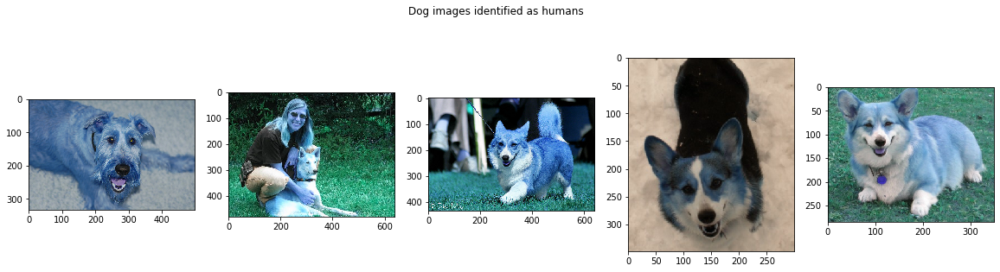

In [63]:
fig, axs = plt.subplots(1,5, figsize=(20,5))
fig.suptitle("Dog images identified as humans")

for i, path in enumerate(fp[:5]):
    axs[i].imshow(cv2.imread(path))
    
print("Apparently, humans might also be present in some dog pictures.")

We suggest the face detector from OpenCV as a potential way to detect human images in your algorithm, but you are free to explore other approaches, especially approaches that make use of deep learning :).  Please use the code cell below to design and test your own face detection algorithm.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [ ]:
### (Optional) 
### TODO: Test performance of another face detection algorithm.
### Feel free to use as many code cells as needed.

---
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, we use a [pre-trained model](http://pytorch.org/docs/master/torchvision/models.html) to detect dogs in images.  

### Obtain Pre-trained VGG-16 Model

The code cell below downloads the VGG-16 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  

In [64]:
import torch
import torchvision.models as models

# define VGG16 model
VGG16 = models.vgg16(pretrained=True)

# check if CUDA is available
use_cuda = torch.cuda.is_available()

# move model to GPU if CUDA is available
if use_cuda:
    VGG16 = VGG16.cuda()

In [65]:
# Freeze model layers

for param in VGG16.parameters():
    param.requires_grad = False

Given an image, this pre-trained VGG-16 model returns a prediction (derived from the 1000 possible categories in ImageNet) for the object that is contained in the image.

### (IMPLEMENTATION) Making Predictions with a Pre-trained Model

In the next code cell, you will write a function that accepts a path to an image (such as `'dogImages/train/001.Affenpinscher/Affenpinscher_00001.jpg'`) as input and returns the index corresponding to the ImageNet class that is predicted by the pre-trained VGG-16 model.  The output should always be an integer between 0 and 999, inclusive.

Before writing the function, make sure that you take the time to learn  how to appropriately pre-process tensors for pre-trained models in the [PyTorch documentation](http://pytorch.org/docs/stable/torchvision/models.html).

In [68]:
from PIL import Image
import torchvision.transforms as transforms

# Set PIL to be tolerant of image files that are truncated.
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

def VGG16_predict(img_path):
    '''
    Use pre-trained VGG-16 model to obtain index corresponding to 
    predicted ImageNet class for image at specified path
    
    Args:
        img_path: path to an image
        
    Returns:
        Index corresponding to VGG-16 model's prediction
    '''
    
    ## TODO: Complete the function.
    ## Load and pre-process an image from the given img_path
    ## Return the *index* of the predicted class for that image
    
    # Step 0. Load file
    img_raw = Image.open(img_path)
    img_np = np.asarray(img_raw).transpose(2,0,1) # reordering dimensions to [channel, h, w]
    t = torch.tensor(img_np, dtype=torch.float32) # convert to torch tensor
    
    """ Step 1. Transform PIL image using following manipulations:
        - Resize to 256x256
        - Crop at center to 224x224
        - Normalize using mean = [0.485, 0.456, 0.406] and std = [0.229, 0.224, 0.225]
    """
    transform = transforms.Compose([            
        transforms.Resize(256),                    
        transforms.CenterCrop(224),                 
        transforms.ToTensor(),           
        transforms.Normalize(                
            mean=[0.485, 0.456, 0.406],             
            std=[0.229, 0.224, 0.225]
        )])

    t = transform(img_raw)

    t = t.unsqueeze(0) # setting tensor te required dimensions [batch, channel, h, w]
    
    # Step 2. Obtaining predicted class
    pred = torch.argmax(VGG16(t))
    
    
    return pred

### (IMPLEMENTATION) Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained VGG-16 model, we need only check if the pre-trained model predicts an index between 151 and 268 (inclusive).

Use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).

In [66]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    idx = VGG16_predict(img_path)
    
    if idx in range(151, 269):
        return True
    else:
        return False
    


### (IMPLEMENTATION) Assess the Dog Detector

__Question 2:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ 

- 96% detected as dog (4% False Negatives)
- 1% falsely detected as dog on human images (False Positive)

See analysis below


In [70]:
### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.

d = 0 # dog imgs counter
d_fn = [] # dog imgs false negatives

h = 0 # human imgs counter
h_fp = [] # dog false positives

for path in tqdm(dog_files_short, position=0):
    pred = dog_detector(path)
    
    if pred:
        d += 1
    else:
        d_fn.append(path)
    
for path in tqdm(human_files_short, position=0):
    pred = dog_detector(path)
    
    if pred:
        h_fp.append(path)
    else:
        h += 1
        
print("TP: ", d/100, "\nFP: ", h/100)


100%|██████████| 100/100 [01:19<00:00,  1.25it/s]

TP:  0.96 
FP:  0.99


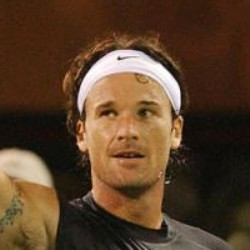

In [71]:
# Lets check the missclassified images

# Starting with the FP on human ds
Image.open(h_fp[0])

# Clearly a mistake

0 :	 205  -  flat-coated retriever
1 :	 158  -  toy terrier
2 :	 273  -  dingo, warrigal, warragal, Canis dingo
3 :	 273  -  dingo, warrigal, warragal, Canis dingo
4 :	 273  -  dingo, warrigal, warragal, Canis dingo


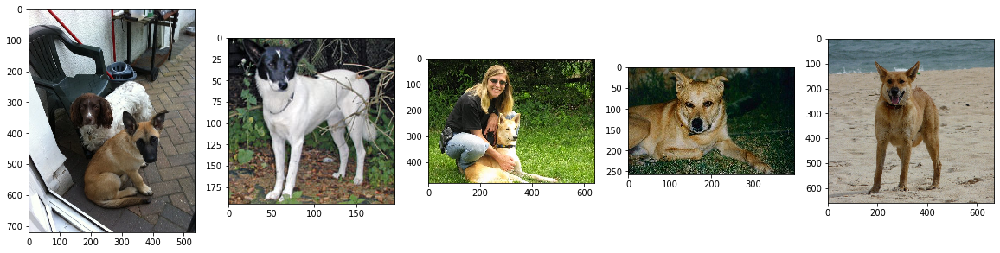

In [165]:
# The FNs

fig, axs = plt.subplots(1,5, figsize=(20,5))

for i, img in enumerate(d_fn):
    axs[i].imshow(np.asarray(Image.open(img, 'r')))
    idx = VGG16_predict(img).item()
    print(i, ":\t", idx, " - ", img_dict[idx])


In [10]:
import random

random.choice(human_files)

'lfw/Kristin_Scott/Kristin_Scott_0001.jpg'

Seems like VGG16 got the first two images correctly from the second try, and other dogs were classified as dingo, which is basically from the same animal family.

# Examples of pictures

(250, 250, 3)

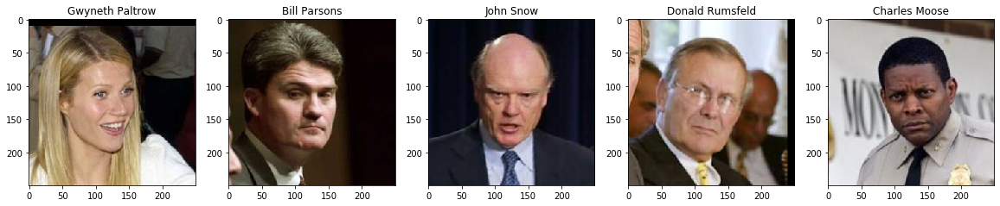

In [40]:
from PIL import Image

fig, axs = plt.subplots(1,5, figsize=(20,5))

for i in range (5):
    img = random.choice(human_files)
    axs[i].imshow(np.asarray(Image.open(img, 'r')))
    name = " ".join(img.split("/")[-1].split("_")[:-1])
    axs[i].set_title(name)
    #idx = VGG16_predict(img).item()
    #print(i, ":\t", idx, " - ", img_dict[idx])
#fig.savefig("images/report/humans.jpg")
np.asarray(Image.open(img, 'r')).shape

In [49]:
# class distribution
import pandas as pd

individuals_files = np.array(glob("lfw/*"))
individuals_classes = {person.split("/")[1] : len(os.listdir(person)) for person in individuals_files}
pd.Series(individuals_classes).describe()

count    5749.000000
mean        2.301792
std         9.016410
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max       530.000000
dtype: float64

In [66]:
pd.Series(individuals_classes).median()

1.0

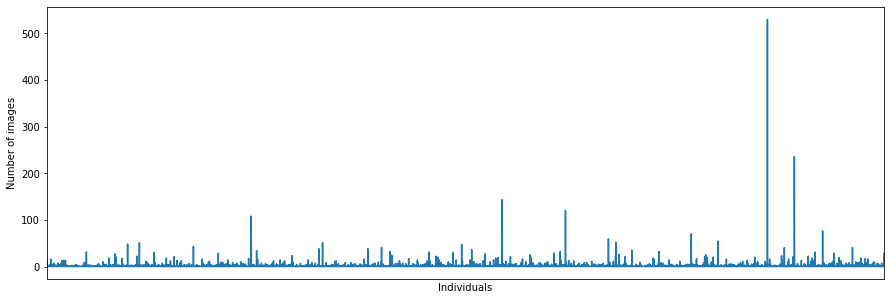

In [90]:
x = pd.Series(individuals_classes)

ax = x.plot(figsize=(15,5))
ax.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off
ax.set_ylabel("Number of images")
ax.set_xlabel("Individuals")
ax.figure.savefig("images/report/human_dist.jpg")

In [73]:
dogs_files_train = np.array(glob("dogImages/train/*"))
dogs_classes_dist_train = {dog.split(".")[1] : len(os.listdir(dog)) for dog in dogs_files_train}
pd.Series(dogs_classes_dist_train).describe()

count    133.000000
mean      50.225564
std       11.863885
min       26.000000
25%       42.000000
50%       50.000000
75%       61.000000
max       77.000000
dtype: float64

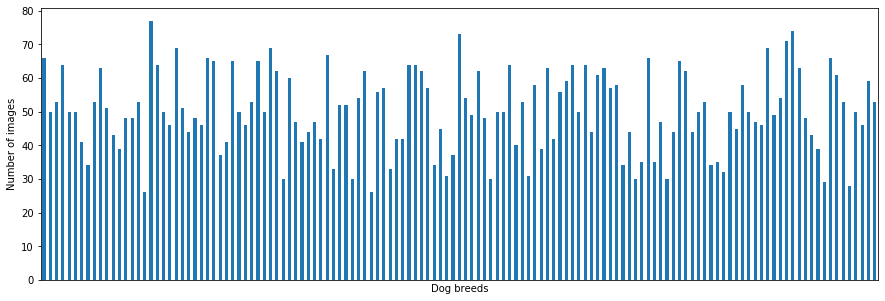

In [91]:
ax = pd.Series(dogs_classes_dist_train).plot(kind="bar", figsize=(15,5))
ax.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off
ax.set_ylabel("Number of images")
ax.set_xlabel("Dog breeds")
ax.figure.savefig("images/report/dog_dist.jpg")

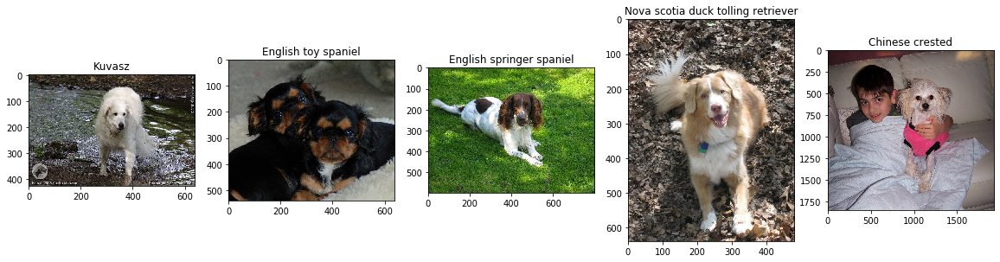

In [30]:
from PIL import Image

fig, axs = plt.subplots(1,5, figsize=(20,5))

for i in range (5):
    img = random.choice(dog_files)
    axs[i].imshow(np.asarray(Image.open(img, 'r')))
    name = " ".join(img.split("/")[-1].split("_")[:-1])
    axs[i].set_title(name)
    #idx = VGG16_predict(img).item()
    #print(i, ":\t", idx, " - ", img_dict[idx])
fig.savefig("images/report/dogs.jpg")

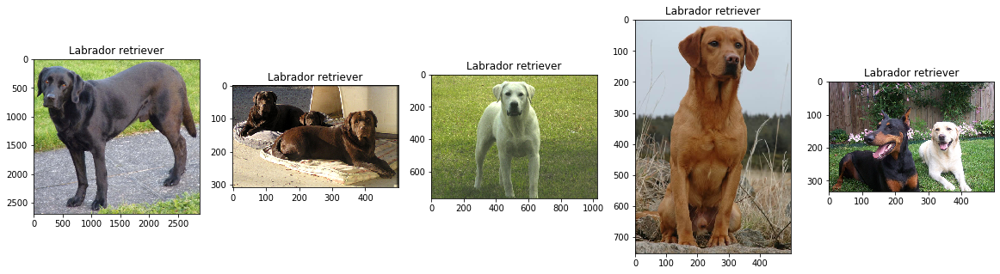

In [39]:
fig, axs = plt.subplots(1,5, figsize=(20,5))
path = "dogImages/train/096.Labrador_retriever/"

for i in range (5):
    img = random.choice(os.listdir(path))
    axs[i].imshow(np.asarray(Image.open(path + img, 'r')))
    name = " ".join(img.split("/")[-1].split("_")[:-1])
    axs[i].set_title(name)
    #idx = VGG16_predict(img).item()
    #print(i, ":\t", idx, " - ", img_dict[idx])
fig.savefig("images/report/labradors.jpg")

In [37]:
img_dict = {0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma maculatum',
 29: 'axolotl, mud puppy, Ambystoma mexicanum',
 30: 'bullfrog, Rana catesbeiana',
 31: 'tree frog, tree-frog',
 32: 'tailed frog, bell toad, ribbed toad, tailed toad, Ascaphus trui',
 33: 'loggerhead, loggerhead turtle, Caretta caretta',
 34: 'leatherback turtle, leatherback, leathery turtle, Dermochelys coriacea',
 35: 'mud turtle',
 36: 'terrapin',
 37: 'box turtle, box tortoise',
 38: 'banded gecko',
 39: 'common iguana, iguana, Iguana iguana',
 40: 'American chameleon, anole, Anolis carolinensis',
 41: 'whiptail, whiptail lizard',
 42: 'agama',
 43: 'frilled lizard, Chlamydosaurus kingi',
 44: 'alligator lizard',
 45: 'Gila monster, Heloderma suspectum',
 46: 'green lizard, Lacerta viridis',
 47: 'African chameleon, Chamaeleo chamaeleon',
 48: 'Komodo dragon, Komodo lizard, dragon lizard, giant lizard, Varanus komodoensis',
 49: 'African crocodile, Nile crocodile, Crocodylus niloticus',
 50: 'American alligator, Alligator mississipiensis',
 51: 'triceratops',
 52: 'thunder snake, worm snake, Carphophis amoenus',
 53: 'ringneck snake, ring-necked snake, ring snake',
 54: 'hognose snake, puff adder, sand viper',
 55: 'green snake, grass snake',
 56: 'king snake, kingsnake',
 57: 'garter snake, grass snake',
 58: 'water snake',
 59: 'vine snake',
 60: 'night snake, Hypsiglena torquata',
 61: 'boa constrictor, Constrictor constrictor',
 62: 'rock python, rock snake, Python sebae',
 63: 'Indian cobra, Naja naja',
 64: 'green mamba',
 65: 'sea snake',
 66: 'horned viper, cerastes, sand viper, horned asp, Cerastes cornutus',
 67: 'diamondback, diamondback rattlesnake, Crotalus adamanteus',
 68: 'sidewinder, horned rattlesnake, Crotalus cerastes',
 69: 'trilobite',
 70: 'harvestman, daddy longlegs, Phalangium opilio',
 71: 'scorpion',
 72: 'black and gold garden spider, Argiope aurantia',
 73: 'barn spider, Araneus cavaticus',
 74: 'garden spider, Aranea diademata',
 75: 'black widow, Latrodectus mactans',
 76: 'tarantula',
 77: 'wolf spider, hunting spider',
 78: 'tick',
 79: 'centipede',
 80: 'black grouse',
 81: 'ptarmigan',
 82: 'ruffed grouse, partridge, Bonasa umbellus',
 83: 'prairie chicken, prairie grouse, prairie fowl',
 84: 'peacock',
 85: 'quail',
 86: 'partridge',
 87: 'African grey, African gray, Psittacus erithacus',
 88: 'macaw',
 89: 'sulphur-crested cockatoo, Kakatoe galerita, Cacatua galerita',
 90: 'lorikeet',
 91: 'coucal',
 92: 'bee eater',
 93: 'hornbill',
 94: 'hummingbird',
 95: 'jacamar',
 96: 'toucan',
 97: 'drake',
 98: 'red-breasted merganser, Mergus serrator',
 99: 'goose',
 100: 'black swan, Cygnus atratus',
 101: 'tusker',
 102: 'echidna, spiny anteater, anteater',
 103: 'platypus, duckbill, duckbilled platypus, duck-billed platypus, Ornithorhynchus anatinus',
 104: 'wallaby, brush kangaroo',
 105: 'koala, koala bear, kangaroo bear, native bear, Phascolarctos cinereus',
 106: 'wombat',
 107: 'jellyfish',
 108: 'sea anemone, anemone',
 109: 'brain coral',
 110: 'flatworm, platyhelminth',
 111: 'nematode, nematode worm, roundworm',
 112: 'conch',
 113: 'snail',
 114: 'slug',
 115: 'sea slug, nudibranch',
 116: 'chiton, coat-of-mail shell, sea cradle, polyplacophore',
 117: 'chambered nautilus, pearly nautilus, nautilus',
 118: 'Dungeness crab, Cancer magister',
 119: 'rock crab, Cancer irroratus',
 120: 'fiddler crab',
 121: 'king crab, Alaska crab, Alaskan king crab, Alaska king crab, Paralithodes camtschatica',
 122: 'American lobster, Northern lobster, Maine lobster, Homarus americanus',
 123: 'spiny lobster, langouste, rock lobster, crawfish, crayfish, sea crawfish',
 124: 'crayfish, crawfish, crawdad, crawdaddy',
 125: 'hermit crab',
 126: 'isopod',
 127: 'white stork, Ciconia ciconia',
 128: 'black stork, Ciconia nigra',
 129: 'spoonbill',
 130: 'flamingo',
 131: 'little blue heron, Egretta caerulea',
 132: 'American egret, great white heron, Egretta albus',
 133: 'bittern',
 134: 'crane',
 135: 'limpkin, Aramus pictus',
 136: 'European gallinule, Porphyrio porphyrio',
 137: 'American coot, marsh hen, mud hen, water hen, Fulica americana',
 138: 'bustard',
 139: 'ruddy turnstone, Arenaria interpres',
 140: 'red-backed sandpiper, dunlin, Erolia alpina',
 141: 'redshank, Tringa totanus',
 142: 'dowitcher',
 143: 'oystercatcher, oyster catcher',
 144: 'pelican',
 145: 'king penguin, Aptenodytes patagonica',
 146: 'albatross, mollymawk',
 147: 'grey whale, gray whale, devilfish, Eschrichtius gibbosus, Eschrichtius robustus',
 148: 'killer whale, killer, orca, grampus, sea wolf, Orcinus orca',
 149: 'dugong, Dugong dugon',
 150: 'sea lion',
 151: 'Chihuahua',
 152: 'Japanese spaniel',
 153: 'Maltese dog, Maltese terrier, Maltese',
 154: 'Pekinese, Pekingese, Peke',
 155: 'Shih-Tzu',
 156: 'Blenheim spaniel',
 157: 'papillon',
 158: 'toy terrier',
 159: 'Rhodesian ridgeback',
 160: 'Afghan hound, Afghan',
 161: 'basset, basset hound',
 162: 'beagle',
 163: 'bloodhound, sleuthhound',
 164: 'bluetick',
 165: 'black-and-tan coonhound',
 166: 'Walker hound, Walker foxhound',
 167: 'English foxhound',
 168: 'redbone',
 169: 'borzoi, Russian wolfhound',
 170: 'Irish wolfhound',
 171: 'Italian greyhound',
 172: 'whippet',
 173: 'Ibizan hound, Ibizan Podenco',
 174: 'Norwegian elkhound, elkhound',
 175: 'otterhound, otter hound',
 176: 'Saluki, gazelle hound',
 177: 'Scottish deerhound, deerhound',
 178: 'Weimaraner',
 179: 'Staffordshire bullterrier, Staffordshire bull terrier',
 180: 'American Staffordshire terrier, Staffordshire terrier, American pit bull terrier, pit bull terrier',
 181: 'Bedlington terrier',
 182: 'Border terrier',
 183: 'Kerry blue terrier',
 184: 'Irish terrier',
 185: 'Norfolk terrier',
 186: 'Norwich terrier',
 187: 'Yorkshire terrier',
 188: 'wire-haired fox terrier',
 189: 'Lakeland terrier',
 190: 'Sealyham terrier, Sealyham',
 191: 'Airedale, Airedale terrier',
 192: 'cairn, cairn terrier',
 193: 'Australian terrier',
 194: 'Dandie Dinmont, Dandie Dinmont terrier',
 195: 'Boston bull, Boston terrier',
 196: 'miniature schnauzer',
 197: 'giant schnauzer',
 198: 'standard schnauzer',
 199: 'Scotch terrier, Scottish terrier, Scottie',
 200: 'Tibetan terrier, chrysanthemum dog',
 201: 'silky terrier, Sydney silky',
 202: 'soft-coated wheaten terrier',
 203: 'West Highland white terrier',
 204: 'Lhasa, Lhasa apso',
 205: 'flat-coated retriever',
 206: 'curly-coated retriever',
 207: 'golden retriever',
 208: 'Labrador retriever',
 209: 'Chesapeake Bay retriever',
 210: 'German short-haired pointer',
 211: 'vizsla, Hungarian pointer',
 212: 'English setter',
 213: 'Irish setter, red setter',
 214: 'Gordon setter',
 215: 'Brittany spaniel',
 216: 'clumber, clumber spaniel',
 217: 'English springer, English springer spaniel',
 218: 'Welsh springer spaniel',
 219: 'cocker spaniel, English cocker spaniel, cocker',
 220: 'Sussex spaniel',
 221: 'Irish water spaniel',
 222: 'kuvasz',
 223: 'schipperke',
 224: 'groenendael',
 225: 'malinois',
 226: 'briard',
 227: 'kelpie',
 228: 'komondor',
 229: 'Old English sheepdog, bobtail',
 230: 'Shetland sheepdog, Shetland sheep dog, Shetland',
 231: 'collie',
 232: 'Border collie',
 233: 'Bouvier des Flandres, Bouviers des Flandres',
 234: 'Rottweiler',
 235: 'German shepherd, German shepherd dog, German police dog, alsatian',
 236: 'Doberman, Doberman pinscher',
 237: 'miniature pinscher',
 238: 'Greater Swiss Mountain dog',
 239: 'Bernese mountain dog',
 240: 'Appenzeller',
 241: 'EntleBucher',
 242: 'boxer',
 243: 'bull mastiff',
 244: 'Tibetan mastiff',
 245: 'French bulldog',
 246: 'Great Dane',
 247: 'Saint Bernard, St Bernard',
 248: 'Eskimo dog, husky',
 249: 'malamute, malemute, Alaskan malamute',
 250: 'Siberian husky',
 251: 'dalmatian, coach dog, carriage dog',
 252: 'affenpinscher, monkey pinscher, monkey dog',
 253: 'basenji',
 254: 'pug, pug-dog',
 255: 'Leonberg',
 256: 'Newfoundland, Newfoundland dog',
 257: 'Great Pyrenees',
 258: 'Samoyed, Samoyede',
 259: 'Pomeranian',
 260: 'chow, chow chow',
 261: 'keeshond',
 262: 'Brabancon griffon',
 263: 'Pembroke, Pembroke Welsh corgi',
 264: 'Cardigan, Cardigan Welsh corgi',
 265: 'toy poodle',
 266: 'miniature poodle',
 267: 'standard poodle',
 268: 'Mexican hairless',
 269: 'timber wolf, grey wolf, gray wolf, Canis lupus',
 270: 'white wolf, Arctic wolf, Canis lupus tundrarum',
 271: 'red wolf, maned wolf, Canis rufus, Canis niger',
 272: 'coyote, prairie wolf, brush wolf, Canis latrans',
 273: 'dingo, warrigal, warragal, Canis dingo',
 274: 'dhole, Cuon alpinus',
 275: 'African hunting dog, hyena dog, Cape hunting dog, Lycaon pictus',
 276: 'hyena, hyaena',
 277: 'red fox, Vulpes vulpes',
 278: 'kit fox, Vulpes macrotis',
 279: 'Arctic fox, white fox, Alopex lagopus',
 280: 'grey fox, gray fox, Urocyon cinereoargenteus',
 281: 'tabby, tabby cat',
 282: 'tiger cat',
 283: 'Persian cat',
 284: 'Siamese cat, Siamese',
 285: 'Egyptian cat',
 286: 'cougar, puma, catamount, mountain lion, painter, panther, Felis concolor',
 287: 'lynx, catamount',
 288: 'leopard, Panthera pardus',
 289: 'snow leopard, ounce, Panthera uncia',
 290: 'jaguar, panther, Panthera onca, Felis onca',
 291: 'lion, king of beasts, Panthera leo',
 292: 'tiger, Panthera tigris',
 293: 'cheetah, chetah, Acinonyx jubatus',
 294: 'brown bear, bruin, Ursus arctos',
 295: 'American black bear, black bear, Ursus americanus, Euarctos americanus',
 296: 'ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus',
 297: 'sloth bear, Melursus ursinus, Ursus ursinus',
 298: 'mongoose',
 299: 'meerkat, mierkat',
 300: 'tiger beetle',
 301: 'ladybug, ladybeetle, lady beetle, ladybird, ladybird beetle',
 302: 'ground beetle, carabid beetle',
 303: 'long-horned beetle, longicorn, longicorn beetle',
 304: 'leaf beetle, chrysomelid',
 305: 'dung beetle',
 306: 'rhinoceros beetle',
 307: 'weevil',
 308: 'fly',
 309: 'bee',
 310: 'ant, emmet, pismire',
 311: 'grasshopper, hopper',
 312: 'cricket',
 313: 'walking stick, walkingstick, stick insect',
 314: 'cockroach, roach',
 315: 'mantis, mantid',
 316: 'cicada, cicala',
 317: 'leafhopper',
 318: 'lacewing, lacewing fly',
 319: "dragonfly, darning needle, devil's darning needle, sewing needle, snake feeder, snake doctor, mosquito hawk, skeeter hawk",
 320: 'damselfly',
 321: 'admiral',
 322: 'ringlet, ringlet butterfly',
 323: 'monarch, monarch butterfly, milkweed butterfly, Danaus plexippus',
 324: 'cabbage butterfly',
 325: 'sulphur butterfly, sulfur butterfly',
 326: 'lycaenid, lycaenid butterfly',
 327: 'starfish, sea star',
 328: 'sea urchin',
 329: 'sea cucumber, holothurian',
 330: 'wood rabbit, cottontail, cottontail rabbit',
 331: 'hare',
 332: 'Angora, Angora rabbit',
 333: 'hamster',
 334: 'porcupine, hedgehog',
 335: 'fox squirrel, eastern fox squirrel, Sciurus niger',
 336: 'marmot',
 337: 'beaver',
 338: 'guinea pig, Cavia cobaya',
 339: 'sorrel',
 340: 'zebra',
 341: 'hog, pig, grunter, squealer, Sus scrofa',
 342: 'wild boar, boar, Sus scrofa',
 343: 'warthog',
 344: 'hippopotamus, hippo, river horse, Hippopotamus amphibius',
 345: 'ox',
 346: 'water buffalo, water ox, Asiatic buffalo, Bubalus bubalis',
 347: 'bison',
 348: 'ram, tup',
 349: 'bighorn, bighorn sheep, cimarron, Rocky Mountain bighorn, Rocky Mountain sheep, Ovis canadensis',
 350: 'ibex, Capra ibex',
 351: 'hartebeest',
 352: 'impala, Aepyceros melampus',
 353: 'gazelle',
 354: 'Arabian camel, dromedary, Camelus dromedarius',
 355: 'llama',
 356: 'weasel',
 357: 'mink',
 358: 'polecat, fitch, foulmart, foumart, Mustela putorius',
 359: 'black-footed ferret, ferret, Mustela nigripes',
 360: 'otter',
 361: 'skunk, polecat, wood pussy',
 362: 'badger',
 363: 'armadillo',
 364: 'three-toed sloth, ai, Bradypus tridactylus',
 365: 'orangutan, orang, orangutang, Pongo pygmaeus',
 366: 'gorilla, Gorilla gorilla',
 367: 'chimpanzee, chimp, Pan troglodytes',
 368: 'gibbon, Hylobates lar',
 369: 'siamang, Hylobates syndactylus, Symphalangus syndactylus',
 370: 'guenon, guenon monkey',
 371: 'patas, hussar monkey, Erythrocebus patas',
 372: 'baboon',
 373: 'macaque',
 374: 'langur',
 375: 'colobus, colobus monkey',
 376: 'proboscis monkey, Nasalis larvatus',
 377: 'marmoset',
 378: 'capuchin, ringtail, Cebus capucinus',
 379: 'howler monkey, howler',
 380: 'titi, titi monkey',
 381: 'spider monkey, Ateles geoffroyi',
 382: 'squirrel monkey, Saimiri sciureus',
 383: 'Madagascar cat, ring-tailed lemur, Lemur catta',
 384: 'indri, indris, Indri indri, Indri brevicaudatus',
 385: 'Indian elephant, Elephas maximus',
 386: 'African elephant, Loxodonta africana',
 387: 'lesser panda, red panda, panda, bear cat, cat bear, Ailurus fulgens',
 388: 'giant panda, panda, panda bear, coon bear, Ailuropoda melanoleuca',
 389: 'barracouta, snoek',
 390: 'eel',
 391: 'coho, cohoe, coho salmon, blue jack, silver salmon, Oncorhynchus kisutch',
 392: 'rock beauty, Holocanthus tricolor',
 393: 'anemone fish',
 394: 'sturgeon',
 395: 'gar, garfish, garpike, billfish, Lepisosteus osseus',
 396: 'lionfish',
 397: 'puffer, pufferfish, blowfish, globefish',
 398: 'abacus',
 399: 'abaya',
 400: "academic gown, academic robe, judge's robe",
 401: 'accordion, piano accordion, squeeze box',
 402: 'acoustic guitar',
 403: 'aircraft carrier, carrier, flattop, attack aircraft carrier',
 404: 'airliner',
 405: 'airship, dirigible',
 406: 'altar',
 407: 'ambulance',
 408: 'amphibian, amphibious vehicle',
 409: 'analog clock',
 410: 'apiary, bee house',
 411: 'apron',
 412: 'ashcan, trash can, garbage can, wastebin, ash bin, ash-bin, ashbin, dustbin, trash barrel, trash bin',
 413: 'assault rifle, assault gun',
 414: 'backpack, back pack, knapsack, packsack, rucksack, haversack',
 415: 'bakery, bakeshop, bakehouse',
 416: 'balance beam, beam',
 417: 'balloon',
 418: 'ballpoint, ballpoint pen, ballpen, Biro',
 419: 'Band Aid',
 420: 'banjo',
 421: 'bannister, banister, balustrade, balusters, handrail',
 422: 'barbell',
 423: 'barber chair',
 424: 'barbershop',
 425: 'barn',
 426: 'barometer',
 427: 'barrel, cask',
 428: 'barrow, garden cart, lawn cart, wheelbarrow',
 429: 'baseball',
 430: 'basketball',
 431: 'bassinet',
 432: 'bassoon',
 433: 'bathing cap, swimming cap',
 434: 'bath towel',
 435: 'bathtub, bathing tub, bath, tub',
 436: 'beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon',
 437: 'beacon, lighthouse, beacon light, pharos',
 438: 'beaker',
 439: 'bearskin, busby, shako',
 440: 'beer bottle',
 441: 'beer glass',
 442: 'bell cote, bell cot',
 443: 'bib',
 444: 'bicycle-built-for-two, tandem bicycle, tandem',
 445: 'bikini, two-piece',
 446: 'binder, ring-binder',
 447: 'binoculars, field glasses, opera glasses',
 448: 'birdhouse',
 449: 'boathouse',
 450: 'bobsled, bobsleigh, bob',
 451: 'bolo tie, bolo, bola tie, bola',
 452: 'bonnet, poke bonnet',
 453: 'bookcase',
 454: 'bookshop, bookstore, bookstall',
 455: 'bottlecap',
 456: 'bow',
 457: 'bow tie, bow-tie, bowtie',
 458: 'brass, memorial tablet, plaque',
 459: 'brassiere, bra, bandeau',
 460: 'breakwater, groin, groyne, mole, bulwark, seawall, jetty',
 461: 'breastplate, aegis, egis',
 462: 'broom',
 463: 'bucket, pail',
 464: 'buckle',
 465: 'bulletproof vest',
 466: 'bullet train, bullet',
 467: 'butcher shop, meat market',
 468: 'cab, hack, taxi, taxicab',
 469: 'caldron, cauldron',
 470: 'candle, taper, wax light',
 471: 'cannon',
 472: 'canoe',
 473: 'can opener, tin opener',
 474: 'cardigan',
 475: 'car mirror',
 476: 'carousel, carrousel, merry-go-round, roundabout, whirligig',
 477: "carpenter's kit, tool kit",
 478: 'carton',
 479: 'car wheel',
 480: 'cash machine, cash dispenser, automated teller machine, automatic teller machine, automated teller, automatic teller, ATM',
 481: 'cassette',
 482: 'cassette player',
 483: 'castle',
 484: 'catamaran',
 485: 'CD player',
 486: 'cello, violoncello',
 487: 'cellular telephone, cellular phone, cellphone, cell, mobile phone',
 488: 'chain',
 489: 'chainlink fence',
 490: 'chain mail, ring mail, mail, chain armor, chain armour, ring armor, ring armour',
 491: 'chain saw, chainsaw',
 492: 'chest',
 493: 'chiffonier, commode',
 494: 'chime, bell, gong',
 495: 'china cabinet, china closet',
 496: 'Christmas stocking',
 497: 'church, church building',
 498: 'cinema, movie theater, movie theatre, movie house, picture palace',
 499: 'cleaver, meat cleaver, chopper',
 500: 'cliff dwelling',
 501: 'cloak',
 502: 'clog, geta, patten, sabot',
 503: 'cocktail shaker',
 504: 'coffee mug',
 505: 'coffeepot',
 506: 'coil, spiral, volute, whorl, helix',
 507: 'combination lock',
 508: 'computer keyboard, keypad',
 509: 'confectionery, confectionary, candy store',
 510: 'container ship, containership, container vessel',
 511: 'convertible',
 512: 'corkscrew, bottle screw',
 513: 'cornet, horn, trumpet, trump',
 514: 'cowboy boot',
 515: 'cowboy hat, ten-gallon hat',
 516: 'cradle',
 517: 'crane',
 518: 'crash helmet',
 519: 'crate',
 520: 'crib, cot',
 521: 'Crock Pot',
 522: 'croquet ball',
 523: 'crutch',
 524: 'cuirass',
 525: 'dam, dike, dyke',
 526: 'desk',
 527: 'desktop computer',
 528: 'dial telephone, dial phone',
 529: 'diaper, nappy, napkin',
 530: 'digital clock',
 531: 'digital watch',
 532: 'dining table, board',
 533: 'dishrag, dishcloth',
 534: 'dishwasher, dish washer, dishwashing machine',
 535: 'disk brake, disc brake',
 536: 'dock, dockage, docking facility',
 537: 'dogsled, dog sled, dog sleigh',
 538: 'dome',
 539: 'doormat, welcome mat',
 540: 'drilling platform, offshore rig',
 541: 'drum, membranophone, tympan',
 542: 'drumstick',
 543: 'dumbbell',
 544: 'Dutch oven',
 545: 'electric fan, blower',
 546: 'electric guitar',
 547: 'electric locomotive',
 548: 'entertainment center',
 549: 'envelope',
 550: 'espresso maker',
 551: 'face powder',
 552: 'feather boa, boa',
 553: 'file, file cabinet, filing cabinet',
 554: 'fireboat',
 555: 'fire engine, fire truck',
 556: 'fire screen, fireguard',
 557: 'flagpole, flagstaff',
 558: 'flute, transverse flute',
 559: 'folding chair',
 560: 'football helmet',
 561: 'forklift',
 562: 'fountain',
 563: 'fountain pen',
 564: 'four-poster',
 565: 'freight car',
 566: 'French horn, horn',
 567: 'frying pan, frypan, skillet',
 568: 'fur coat',
 569: 'garbage truck, dustcart',
 570: 'gasmask, respirator, gas helmet',
 571: 'gas pump, gasoline pump, petrol pump, island dispenser',
 572: 'goblet',
 573: 'go-kart',
 574: 'golf ball',
 575: 'golfcart, golf cart',
 576: 'gondola',
 577: 'gong, tam-tam',
 578: 'gown',
 579: 'grand piano, grand',
 580: 'greenhouse, nursery, glasshouse',
 581: 'grille, radiator grille',
 582: 'grocery store, grocery, food market, market',
 583: 'guillotine',
 584: 'hair slide',
 585: 'hair spray',
 586: 'half track',
 587: 'hammer',
 588: 'hamper',
 589: 'hand blower, blow dryer, blow drier, hair dryer, hair drier',
 590: 'hand-held computer, hand-held microcomputer',
 591: 'handkerchief, hankie, hanky, hankey',
 592: 'hard disc, hard disk, fixed disk',
 593: 'harmonica, mouth organ, harp, mouth harp',
 594: 'harp',
 595: 'harvester, reaper',
 596: 'hatchet',
 597: 'holster',
 598: 'home theater, home theatre',
 599: 'honeycomb',
 600: 'hook, claw',
 601: 'hoopskirt, crinoline',
 602: 'horizontal bar, high bar',
 603: 'horse cart, horse-cart',
 604: 'hourglass',
 605: 'iPod',
 606: 'iron, smoothing iron',
 607: "jack-o'-lantern",
 608: 'jean, blue jean, denim',
 609: 'jeep, landrover',
 610: 'jersey, T-shirt, tee shirt',
 611: 'jigsaw puzzle',
 612: 'jinrikisha, ricksha, rickshaw',
 613: 'joystick',
 614: 'kimono',
 615: 'knee pad',
 616: 'knot',
 617: 'lab coat, laboratory coat',
 618: 'ladle',
 619: 'lampshade, lamp shade',
 620: 'laptop, laptop computer',
 621: 'lawn mower, mower',
 622: 'lens cap, lens cover',
 623: 'letter opener, paper knife, paperknife',
 624: 'library',
 625: 'lifeboat',
 626: 'lighter, light, igniter, ignitor',
 627: 'limousine, limo',
 628: 'liner, ocean liner',
 629: 'lipstick, lip rouge',
 630: 'Loafer',
 631: 'lotion',
 632: 'loudspeaker, speaker, speaker unit, loudspeaker system, speaker system',
 633: "loupe, jeweler's loupe",
 634: 'lumbermill, sawmill',
 635: 'magnetic compass',
 636: 'mailbag, postbag',
 637: 'mailbox, letter box',
 638: 'maillot',
 639: 'maillot, tank suit',
 640: 'manhole cover',
 641: 'maraca',
 642: 'marimba, xylophone',
 643: 'mask',
 644: 'matchstick',
 645: 'maypole',
 646: 'maze, labyrinth',
 647: 'measuring cup',
 648: 'medicine chest, medicine cabinet',
 649: 'megalith, megalithic structure',
 650: 'microphone, mike',
 651: 'microwave, microwave oven',
 652: 'military uniform',
 653: 'milk can',
 654: 'minibus',
 655: 'miniskirt, mini',
 656: 'minivan',
 657: 'missile',
 658: 'mitten',
 659: 'mixing bowl',
 660: 'mobile home, manufactured home',
 661: 'Model T',
 662: 'modem',
 663: 'monastery',
 664: 'monitor',
 665: 'moped',
 666: 'mortar',
 667: 'mortarboard',
 668: 'mosque',
 669: 'mosquito net',
 670: 'motor scooter, scooter',
 671: 'mountain bike, all-terrain bike, off-roader',
 672: 'mountain tent',
 673: 'mouse, computer mouse',
 674: 'mousetrap',
 675: 'moving van',
 676: 'muzzle',
 677: 'nail',
 678: 'neck brace',
 679: 'necklace',
 680: 'nipple',
 681: 'notebook, notebook computer',
 682: 'obelisk',
 683: 'oboe, hautboy, hautbois',
 684: 'ocarina, sweet potato',
 685: 'odometer, hodometer, mileometer, milometer',
 686: 'oil filter',
 687: 'organ, pipe organ',
 688: 'oscilloscope, scope, cathode-ray oscilloscope, CRO',
 689: 'overskirt',
 690: 'oxcart',
 691: 'oxygen mask',
 692: 'packet',
 693: 'paddle, boat paddle',
 694: 'paddlewheel, paddle wheel',
 695: 'padlock',
 696: 'paintbrush',
 697: "pajama, pyjama, pj's, jammies",
 698: 'palace',
 699: 'panpipe, pandean pipe, syrinx',
 700: 'paper towel',
 701: 'parachute, chute',
 702: 'parallel bars, bars',
 703: 'park bench',
 704: 'parking meter',
 705: 'passenger car, coach, carriage',
 706: 'patio, terrace',
 707: 'pay-phone, pay-station',
 708: 'pedestal, plinth, footstall',
 709: 'pencil box, pencil case',
 710: 'pencil sharpener',
 711: 'perfume, essence',
 712: 'Petri dish',
 713: 'photocopier',
 714: 'pick, plectrum, plectron',
 715: 'pickelhaube',
 716: 'picket fence, paling',
 717: 'pickup, pickup truck',
 718: 'pier',
 719: 'piggy bank, penny bank',
 720: 'pill bottle',
 721: 'pillow',
 722: 'ping-pong ball',
 723: 'pinwheel',
 724: 'pirate, pirate ship',
 725: 'pitcher, ewer',
 726: "plane, carpenter's plane, woodworking plane",
 727: 'planetarium',
 728: 'plastic bag',
 729: 'plate rack',
 730: 'plow, plough',
 731: "plunger, plumber's helper",
 732: 'Polaroid camera, Polaroid Land camera',
 733: 'pole',
 734: 'police van, police wagon, paddy wagon, patrol wagon, wagon, black Maria',
 735: 'poncho',
 736: 'pool table, billiard table, snooker table',
 737: 'pop bottle, soda bottle',
 738: 'pot, flowerpot',
 739: "potter's wheel",
 740: 'power drill',
 741: 'prayer rug, prayer mat',
 742: 'printer',
 743: 'prison, prison house',
 744: 'projectile, missile',
 745: 'projector',
 746: 'puck, hockey puck',
 747: 'punching bag, punch bag, punching ball, punchball',
 748: 'purse',
 749: 'quill, quill pen',
 750: 'quilt, comforter, comfort, puff',
 751: 'racer, race car, racing car',
 752: 'racket, racquet',
 753: 'radiator',
 754: 'radio, wireless',
 755: 'radio telescope, radio reflector',
 756: 'rain barrel',
 757: 'recreational vehicle, RV, R.V.',
 758: 'reel',
 759: 'reflex camera',
 760: 'refrigerator, icebox',
 761: 'remote control, remote',
 762: 'restaurant, eating house, eating place, eatery',
 763: 'revolver, six-gun, six-shooter',
 764: 'rifle',
 765: 'rocking chair, rocker',
 766: 'rotisserie',
 767: 'rubber eraser, rubber, pencil eraser',
 768: 'rugby ball',
 769: 'rule, ruler',
 770: 'running shoe',
 771: 'safe',
 772: 'safety pin',
 773: 'saltshaker, salt shaker',
 774: 'sandal',
 775: 'sarong',
 776: 'sax, saxophone',
 777: 'scabbard',
 778: 'scale, weighing machine',
 779: 'school bus',
 780: 'schooner',
 781: 'scoreboard',
 782: 'screen, CRT screen',
 783: 'screw',
 784: 'screwdriver',
 785: 'seat belt, seatbelt',
 786: 'sewing machine',
 787: 'shield, buckler',
 788: 'shoe shop, shoe-shop, shoe store',
 789: 'shoji',
 790: 'shopping basket',
 791: 'shopping cart',
 792: 'shovel',
 793: 'shower cap',
 794: 'shower curtain',
 795: 'ski',
 796: 'ski mask',
 797: 'sleeping bag',
 798: 'slide rule, slipstick',
 799: 'sliding door',
 800: 'slot, one-armed bandit',
 801: 'snorkel',
 802: 'snowmobile',
 803: 'snowplow, snowplough',
 804: 'soap dispenser',
 805: 'soccer ball',
 806: 'sock',
 807: 'solar dish, solar collector, solar furnace',
 808: 'sombrero',
 809: 'soup bowl',
 810: 'space bar',
 811: 'space heater',
 812: 'space shuttle',
 813: 'spatula',
 814: 'speedboat',
 815: "spider web, spider's web",
 816: 'spindle',
 817: 'sports car, sport car',
 818: 'spotlight, spot',
 819: 'stage',
 820: 'steam locomotive',
 821: 'steel arch bridge',
 822: 'steel drum',
 823: 'stethoscope',
 824: 'stole',
 825: 'stone wall',
 826: 'stopwatch, stop watch',
 827: 'stove',
 828: 'strainer',
 829: 'streetcar, tram, tramcar, trolley, trolley car',
 830: 'stretcher',
 831: 'studio couch, day bed',
 832: 'stupa, tope',
 833: 'submarine, pigboat, sub, U-boat',
 834: 'suit, suit of clothes',
 835: 'sundial',
 836: 'sunglass',
 837: 'sunglasses, dark glasses, shades',
 838: 'sunscreen, sunblock, sun blocker',
 839: 'suspension bridge',
 840: 'swab, swob, mop',
 841: 'sweatshirt',
 842: 'swimming trunks, bathing trunks',
 843: 'swing',
 844: 'switch, electric switch, electrical switch',
 845: 'syringe',
 846: 'table lamp',
 847: 'tank, army tank, armored combat vehicle, armoured combat vehicle',
 848: 'tape player',
 849: 'teapot',
 850: 'teddy, teddy bear',
 851: 'television, television system',
 852: 'tennis ball',
 853: 'thatch, thatched roof',
 854: 'theater curtain, theatre curtain',
 855: 'thimble',
 856: 'thresher, thrasher, threshing machine',
 857: 'throne',
 858: 'tile roof',
 859: 'toaster',
 860: 'tobacco shop, tobacconist shop, tobacconist',
 861: 'toilet seat',
 862: 'torch',
 863: 'totem pole',
 864: 'tow truck, tow car, wrecker',
 865: 'toyshop',
 866: 'tractor',
 867: 'trailer truck, tractor trailer, trucking rig, rig, articulated lorry, semi',
 868: 'tray',
 869: 'trench coat',
 870: 'tricycle, trike, velocipede',
 871: 'trimaran',
 872: 'tripod',
 873: 'triumphal arch',
 874: 'trolleybus, trolley coach, trackless trolley',
 875: 'trombone',
 876: 'tub, vat',
 877: 'turnstile',
 878: 'typewriter keyboard',
 879: 'umbrella',
 880: 'unicycle, monocycle',
 881: 'upright, upright piano',
 882: 'vacuum, vacuum cleaner',
 883: 'vase',
 884: 'vault',
 885: 'velvet',
 886: 'vending machine',
 887: 'vestment',
 888: 'viaduct',
 889: 'violin, fiddle',
 890: 'volleyball',
 891: 'waffle iron',
 892: 'wall clock',
 893: 'wallet, billfold, notecase, pocketbook',
 894: 'wardrobe, closet, press',
 895: 'warplane, military plane',
 896: 'washbasin, handbasin, washbowl, lavabo, wash-hand basin',
 897: 'washer, automatic washer, washing machine',
 898: 'water bottle',
 899: 'water jug',
 900: 'water tower',
 901: 'whiskey jug',
 902: 'whistle',
 903: 'wig',
 904: 'window screen',
 905: 'window shade',
 906: 'Windsor tie',
 907: 'wine bottle',
 908: 'wing',
 909: 'wok',
 910: 'wooden spoon',
 911: 'wool, woolen, woollen',
 912: 'worm fence, snake fence, snake-rail fence, Virginia fence',
 913: 'wreck',
 914: 'yawl',
 915: 'yurt',
 916: 'web site, website, internet site, site',
 917: 'comic book',
 918: 'crossword puzzle, crossword',
 919: 'street sign',
 920: 'traffic light, traffic signal, stoplight',
 921: 'book jacket, dust cover, dust jacket, dust wrapper',
 922: 'menu',
 923: 'plate',
 924: 'guacamole',
 925: 'consomme',
 926: 'hot pot, hotpot',
 927: 'trifle',
 928: 'ice cream, icecream',
 929: 'ice lolly, lolly, lollipop, popsicle',
 930: 'French loaf',
 931: 'bagel, beigel',
 932: 'pretzel',
 933: 'cheeseburger',
 934: 'hotdog, hot dog, red hot',
 935: 'mashed potato',
 936: 'head cabbage',
 937: 'broccoli',
 938: 'cauliflower',
 939: 'zucchini, courgette',
 940: 'spaghetti squash',
 941: 'acorn squash',
 942: 'butternut squash',
 943: 'cucumber, cuke',
 944: 'artichoke, globe artichoke',
 945: 'bell pepper',
 946: 'cardoon',
 947: 'mushroom',
 948: 'Granny Smith',
 949: 'strawberry',
 950: 'orange',
 951: 'lemon',
 952: 'fig',
 953: 'pineapple, ananas',
 954: 'banana',
 955: 'jackfruit, jak, jack',
 956: 'custard apple',
 957: 'pomegranate',
 958: 'hay',
 959: 'carbonara',
 960: 'chocolate sauce, chocolate syrup',
 961: 'dough',
 962: 'meat loaf, meatloaf',
 963: 'pizza, pizza pie',
 964: 'potpie',
 965: 'burrito',
 966: 'red wine',
 967: 'espresso',
 968: 'cup',
 969: 'eggnog',
 970: 'alp',
 971: 'bubble',
 972: 'cliff, drop, drop-off',
 973: 'coral reef',
 974: 'geyser',
 975: 'lakeside, lakeshore',
 976: 'promontory, headland, head, foreland',
 977: 'sandbar, sand bar',
 978: 'seashore, coast, seacoast, sea-coast',
 979: 'valley, vale',
 980: 'volcano',
 981: 'ballplayer, baseball player',
 982: 'groom, bridegroom',
 983: 'scuba diver',
 984: 'rapeseed',
 985: 'daisy',
 986: "yellow lady's slipper, yellow lady-slipper, Cypripedium calceolus, Cypripedium parviflorum",
 987: 'corn',
 988: 'acorn',
 989: 'hip, rose hip, rosehip',
 990: 'buckeye, horse chestnut, conker',
 991: 'coral fungus',
 992: 'agaric',
 993: 'gyromitra',
 994: 'stinkhorn, carrion fungus',
 995: 'earthstar',
 996: 'hen-of-the-woods, hen of the woods, Polyporus frondosus, Grifola frondosa',
 997: 'bolete',
 998: 'ear, spike, capitulum',
 999: 'toilet tissue, toilet paper, bathroom tissue'}

We suggest VGG-16 as a potential network to detect dog images in your algorithm, but you are free to explore other pre-trained networks (such as [Inception-v3](http://pytorch.org/docs/master/torchvision/models.html#inception-v3), [ResNet-50](http://pytorch.org/docs/master/torchvision/models.html#id3), etc).  Please use the code cell below to test other pre-trained PyTorch models.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [ ]:
### (Optional) 
### TODO: Report the performance of another pre-trained network.
### Feel free to use as many code cells as needed.

In [196]:
# Load models

resnet152 = models.resnet152(pretrained=True)
squeezenet =  models.squeezenet1_1(pretrained=True)

for param in resnet152.parameters():
    param.requires_grad = False
    
for param in squeezenet.parameters():
    param.requires_grad = False


Downloading: "https://download.pytorch.org/models/squeezenet1_1-f364aa15.pth" to /home/le-roy/.cache/torch/hub/checkpoints/squeezenet1_1-f364aa15.pth


In [194]:
def predict(img_path, model):
    '''
    Use pre-trained model to obtain index corresponding to 
    predicted ImageNet class for image at specified path
    
    Args:
        img_path: path to an image
        model:    pre-trained pytorch model instance
        
    Returns:
        Index corresponding to model's prediction
    '''
    
    # Step 0. Load file
    img_raw = Image.open(img_path)
    img_np = np.asarray(img_raw).transpose(2,0,1) # reordering dimensions to [channel, h, w]
    t = torch.tensor(img_np, dtype=torch.float32) # convert to torch tensor
    
    """ Step 1. Transform PIL image using following manipulations:
        - Resize to 256x256
        - Crop at center to 224x224
        - Normalize using mean = [0.485, 0.456, 0.406] and std = [0.229, 0.224, 0.225]
    """
    transform = transforms.Compose([            
        transforms.Resize(256),                    
        transforms.CenterCrop(224),                 
        transforms.ToTensor(),           
        transforms.Normalize(                
            mean=[0.485, 0.456, 0.406],             
            std=[0.229, 0.224, 0.225]
        )])

    t = transform(img_raw)

    t = t.unsqueeze(0) # setting tensor te required dimensions [batch, channel, h, w]
    
    # Step 2. Obtaining predicted class
    pred = torch.argmax(model(t))
    
    
    return pred

def dog_detector(img_path, model):
    idx = predict(img_path, model)
    
    if idx in range(151, 269):
        return True
    else:
        return False
    

In [195]:
# ResNet152

h = np.sum(dog_detector(img, resnet152) for img in tqdm(human_files_short, position=0, leave=True))
s = np.sum(dog_detector(img, resnet152) for img in tqdm(dog_files_short, position=0, leave=True))

print("TP: ", d/100, "\nFP: ", h/100)


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  """Entry point for launching an IPython kernel.
100%|██████████| 100/100 [01:39<00:00,  1.02it/s]





  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  
100%|██████████| 100/100 [01:58<00:00,  1.19s/it]


100%|██████████| 100/100 [01:58<00:00,  1.18s/it]

TP:  0.95 
FP:  0.0


In [197]:
# squeezenet1_1

h = np.sum(dog_detector(img, squeezenet) for img in tqdm(human_files_short, position=0, leave=True))
s = np.sum(dog_detector(img, squeezenet) for img in tqdm(dog_files_short, position=0, leave=True))

print("TP: ", d/100, "\nFP: ", h/100)


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  This is separate from the ipykernel package so we can avoid doing imports until
  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  after removing the cwd from sys.path.
100%|██████████| 100/100 [00:06<00:00, 15.71it/s]

TP:  0.95 
FP:  0.02


Since any significant performance improvements are observed, we will stick with the initial VGG16 model

---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 10%.  In Step 4 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have trouble distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun!

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively).  You may find [this documentation on custom datasets](http://pytorch.org/docs/stable/torchvision/datasets.html) to be a useful resource.  If you are interested in augmenting your training and/or validation data, check out the wide variety of [transforms](http://pytorch.org/docs/stable/torchvision/transforms.html?highlight=transform)!

In [2]:
import os
import torch
import torchvision

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.transforms as transforms



### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes

transform = {
    
    "train" : transforms.Compose([            
    transforms.Resize(256),                    
    transforms.CenterCrop(224),    
    transforms.RandomHorizontalFlip(),
    transforms.RandomAffine(degrees=0.2),
    transforms.ToTensor(),           
    transforms.Normalize(                
        mean=[0.485, 0.456, 0.406],             
        std=[0.229, 0.224, 0.225]
    )]),

    "test" : transforms.Compose([            
    transforms.Resize(256),                    
    transforms.CenterCrop(224),                 
    transforms.ToTensor(),           
    transforms.Normalize(                
        mean=[0.485, 0.456, 0.406],             
        std=[0.229, 0.224, 0.225]
    )])}

train_img = torchvision.datasets.ImageFolder("dogImages/train/", transform=transform["train"])
test_img = torchvision.datasets.ImageFolder("dogImages/test/",   transform=transform["test"])                                                                                                                                                                                          
valid_img = torchvision.datasets.ImageFolder("dogImages/valid/", transform=transform["test"])

train_data = DataLoader(train_img, batch_size=10, shuffle=True)
test_data  = DataLoader(test_img,  batch_size=10, shuffle=True)
valid_data = DataLoader(valid_img, batch_size=10, shuffle=True)

loaders_scratch = {"train" : train_data,
                   "test"  : test_data,
                   "valid" : valid_data}

classes = train_img.classes


In [95]:
print(f"Total of {len(classes)} dog breeds")

Total of 133 dog breeds


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


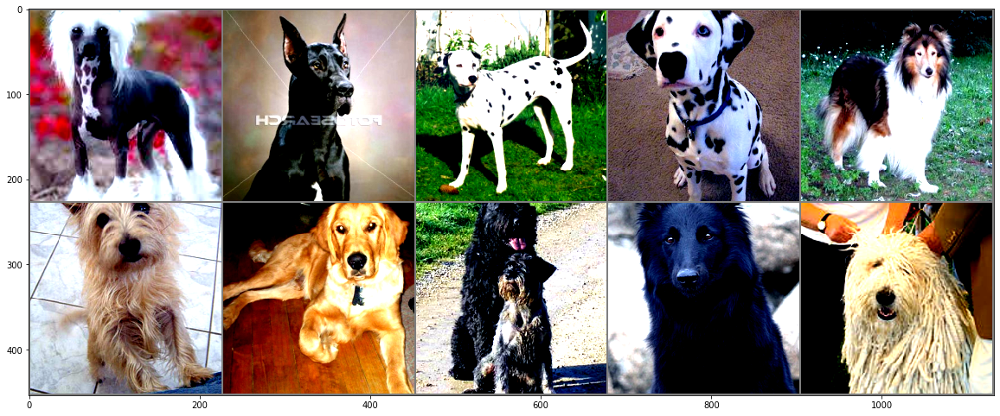

0 049.Chinese_crested
1 078.Great_dane
2 057.Dalmatian
3 057.Dalmatian
4 054.Collie
5 042.Cairn_terrier
6 076.Golden_retriever
7 033.Bouvier_des_flandres
8 021.Belgian_sheepdog
9 094.Komondor


<Figure size 432x288 with 0 Axes>

In [96]:
plt.figure(figsize=(20,10))

def imshow(img):
        img = img / 2 + 0.5 #denormalize
        npimg = img.numpy()
        plt.imshow(np.transpose(npimg, (1,2,0)))
        plt.show()
        plt.savefig("images/report/preprocessed.jpg")
        
dataiter = iter(train_data)
images, labels = dataiter.next()

imshow(torchvision.utils.make_grid(images, nrow=5))
for i, dog in enumerate(labels):
    print(i, classes[dog.item()])

In [97]:
torchvision.utils.save_image(torchvision.utils.make_grid(images, nrow=5), 
                             fp="images/report/preprocessed.jpg")

**Question 3:** Describe your chosen procedure for preprocessing the data. 
- How does your code resize the images (by cropping, stretching, etc)?  What size did you pick for the input tensor, and why?
- Did you decide to augment the dataset?  If so, how (through translations, flips, rotations, etc)?  If not, why not?


**Answer**:

- the input size is 224x224 like in the VGG16 (and majority of other pretrained models on pytorch website). Higher input resolution would also require more computational power, but since I am not using CUDA while training, 224x224 seemed to be an optimal size
- I have added random horizontal flip and affine shifts of up to 20%. Initially I have also added the random resize and crop, but for many samples heads were not in the picture anymore. Since face features are rather more distinctive than bodies, I have decided to remove this augmentation and simply go with standard center crop.

In [238]:
nn.Conv2d(in_channels=3, out_channels=6, kernel_size=(3,3), padding=1)(images[0].unsqueeze(0)).shape

torch.Size([1, 6, 224, 224])

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  Use the template in the code cell below.

In [4]:
import torch.nn as nn
import torch.nn.functional as F

# define the CNN architecture
class Net(nn.Module):
    ### TODO: choose an architecture, and complete the class
    def __init__(self):
        super(Net, self).__init__()
        ## Define layers of a CNN
        
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=6, kernel_size=(3,3), padding=1) # in 3x224x224 -> out 6x112x112
        self.conv2 = nn.Conv2d(in_channels=6, out_channels=16, kernel_size=(3,3), padding=1)  # in 6x112x112 -> out 16x56x56
        self.conv3 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3,3), padding=1) # in 16x56x56 -> out 32x28x28
        self.conv4 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3,3), padding=1) # in 32x28x28 -> out 64x14x14
        self.conv5 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=(3,3), padding=1) # in 64x14x14 -> out 128x7x7
        
        # Batch norm
        self.bn1 = nn.BatchNorm2d(6)
        self.bn2 = nn.BatchNorm2d(16)
        self.bn3 = nn.BatchNorm2d(32)
        self.bn4 = nn.BatchNorm2d(64)

        
        # Fully connected layers
        self.fc1 = nn.Linear(in_features=128*7*7, out_features=256)
        self.fc2 = nn.Linear(in_features=256, out_features= 512)
        self.out = nn.Linear(in_features=512, out_features=133)
        
    
    def forward(self, x):
        ## Define forward behavior
        
        # 1. Conv: in 3x224x224 -> out 6x112x112
        x = self.conv1(x)
        x = F.relu(x)
        x = F.max_pool2d(x, kernel_size=2, stride=2)
        x = self.bn1(x)
        
        # 2. Conv: in 6x112x112 -> out 16x56x56
        x = self.conv2(x)
        x = F.relu(x)
        x = F.max_pool2d(x, kernel_size=2, stride=2)
        x = self.bn2(x)
        
        # 3. Conv: in 16x56x56 -> out 32x28x28
        x = self.conv3(x)
        x = F.relu(x)
        x = F.max_pool2d(x, kernel_size=2, stride=2)
        x = self.bn3(x)
        
        # 4. Conv: in 32x28x28 -> out 64x14x14
        x = self.conv4(x)
        x = F.relu(x)
        x = F.max_pool2d(x, kernel_size=2, stride=2)
        x = self.bn4(x)
        
        # 5. Conv: in 64x14x14 -> out 128x7x7
        x = self.conv5(x)
        x = F.relu(x)
        x = F.max_pool2d(x, kernel_size=2, stride=2)  

        # Flatten
        x = x.reshape(-1, self.nfeatures(x))
        x = F.dropout(x, 0.2)

        
        # 6. FC1: 32*28*28 -> 512
        x = self.fc1(x)
        x = F.relu(x)
        x = F.dropout(x, 0.2)
        
        # 7. FC2: 512 -> 256
        x = self.fc2(x)
        x = F.relu(x)
        
        # 8. Output
        x = self.out(x)  
        return x
    
    def nfeatures(self, x):
        n = 1
        for i in x.size()[1:]:
            n *= i

        return n

#-#-# You do NOT have to modify the code below this line. #-#-#

# instantiate the CNN
model_scratch = Net()

# move tensors to GPU if CUDA is available
#if use_cuda:
#    model_scratch.cuda()

__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  

__Answer:__ 

1. Simple model with 3 Convolutional and 2 Linear layers. Val loss started spiking around 5th epoch -> overfitting
2. Increased complexity in the linear layers (3 layers with more features). This prevented val loss from going up, but model stopped improving at 5-7th epoch 
3. Started experimenting with new Convolutional layers. Adding filters and increasing granularity has imroved performance, but overfitting was still an issue (increasing sparsity between train and valid loss)
4. Added dropout and data augmentation -> slight improvement in val loss
5. Added batch normalisation -> significant improvement in performance

As you will see below, model stopped improving at 15th epoch. There is still a lot of room for improvement. I would try further increasing model complexity and change the size and order of convolutional filters

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/stable/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/stable/optim.html).  Save the chosen loss function as `criterion_scratch`, and the optimizer as `optimizer_scratch` below.

In [47]:
import torch.optim as optim

### TODO: select loss function
criterion_scratch = nn.CrossEntropyLoss()

### TODO: select optimizer
optimizer_scratch = optim.SGD(model_scratch.parameters(), lr=0.001, momentum=0.9)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_scratch.pt'`.

In [8]:
# the following import is required for training to be robust to truncated images
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

train_losses = []
valid_losses = []

def train(n_epochs, loaders, model, optimizer, criterion, use_cuda, save_path):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf 
    
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        
        ###################
        # train the model #
        ###################
        model.train()
        for batch_idx, (data, target) in enumerate(loaders['train']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## find the loss and update the model parameters accordingly
            ## record the average training loss, using something like
            ## train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
            
            optimizer.zero_grad() # zero the parameter gradients 
            
            # forward + backward + optimize
            pred = model(data)
            loss = criterion(pred, target)
            loss.backward()  # backpropagate errors - calculate gradients wrt params
            optimizer.step() # update params
            
            train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
            
            
        ######################    
        # validate the model #
        ######################
        model.eval()
        for batch_idx, (data, target) in enumerate(loaders['valid']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## update the average validation loss
            
            pred = model(data)
            loss = criterion(pred, target)
            valid_loss = valid_loss + ((1 / (batch_idx + 1)) * (loss.data - valid_loss))
            
            valid_losses.append([epoch, batch_idx, valid_loss])
            
            #print(f"Epoch: {epoch} \t Train loss: {train_loss:.4f} \t Valid loss: {valid_loss:.4f}")


            
        # print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, 
            train_loss,
            valid_loss
            ))
        train_losses.append(train_loss)
        valid_losses.append(valid_loss)

        
        ## TODO: save the model if validation loss has decreased
        
        if valid_loss < valid_loss_min:
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss
            
    # return trained model
    return model


epochs = 20
model_name = 'model_scratch.pt'
# train the model
model_scratch = train(epochs, loaders_scratch, model_scratch, optimizer_scratch, 
                      criterion_scratch, use_cuda, model_name)

# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('model_scratch.pt'))

Epoch: 1 	Training Loss: 4.848303 	Validation Loss: 4.704661
Epoch: 2 	Training Loss: 4.498919 	Validation Loss: 4.329505
Epoch: 3 	Training Loss: 4.237106 	Validation Loss: 4.183437
Epoch: 4 	Training Loss: 4.047360 	Validation Loss: 4.090852
Epoch: 5 	Training Loss: 3.910327 	Validation Loss: 4.013178
Epoch: 6 	Training Loss: 3.763604 	Validation Loss: 3.877303
Epoch: 7 	Training Loss: 3.636727 	Validation Loss: 3.821249
Epoch: 8 	Training Loss: 3.493447 	Validation Loss: 3.703688
Epoch: 9 	Training Loss: 3.346449 	Validation Loss: 3.678420
Epoch: 10 	Training Loss: 3.224846 	Validation Loss: 3.870714
Epoch: 11 	Training Loss: 3.080395 	Validation Loss: 3.646093
Epoch: 12 	Training Loss: 2.978658 	Validation Loss: 3.517780
Epoch: 13 	Training Loss: 2.831717 	Validation Loss: 3.468354
Epoch: 14 	Training Loss: 2.696723 	Validation Loss: 3.567818
Epoch: 15 	Training Loss: 2.539376 	Validation Loss: 3.462093
Epoch: 16 	Training Loss: 2.412947 	Validation Loss: 3.441731
Epoch: 17 	Traini

<All keys matched successfully>

In [11]:
training_score = """
Epoch: 1 	Training Loss: 4.848303 	Validation Loss: 4.704661
Epoch: 2 	Training Loss: 4.498919 	Validation Loss: 4.329505
Epoch: 3 	Training Loss: 4.237106 	Validation Loss: 4.183437
Epoch: 4 	Training Loss: 4.047360 	Validation Loss: 4.090852
Epoch: 5 	Training Loss: 3.910327 	Validation Loss: 4.013178
Epoch: 6 	Training Loss: 3.763604 	Validation Loss: 3.877303
Epoch: 7 	Training Loss: 3.636727 	Validation Loss: 3.821249
Epoch: 8 	Training Loss: 3.493447 	Validation Loss: 3.703688
Epoch: 9 	Training Loss: 3.346449 	Validation Loss: 3.678420
Epoch: 10 	Training Loss: 3.224846 	Validation Loss: 3.870714
Epoch: 11 	Training Loss: 3.080395 	Validation Loss: 3.646093
Epoch: 12 	Training Loss: 2.978658 	Validation Loss: 3.517780
Epoch: 13 	Training Loss: 2.831717 	Validation Loss: 3.468354
Epoch: 14 	Training Loss: 2.696723 	Validation Loss: 3.567818
Epoch: 15 	Training Loss: 2.539376 	Validation Loss: 3.462093
Epoch: 16 	Training Loss: 2.412947 	Validation Loss: 3.441731
Epoch: 17 	Training Loss: 2.274463 	Validation Loss: 3.422442
Epoch: 18 	Training Loss: 2.121807 	Validation Loss: 3.412602
Epoch: 19 	Training Loss: 2.008310 	Validation Loss: 3.400733
Epoch: 20 	Training Loss: 1.864391 	Validation Loss: 3.464373
"""

tscore = [t.split("\t") for t in training_score.split("\n")][1:-1]
tscore = [[float(t.split(": ")[1]) for t in line] for line in tscore]

In [25]:
import matplotlib.pyplot as plt
import pandas as pd

train_score_df = pd.DataFrame(tscore, columns=["epoch", "train_loss", "valid_loss"])

Text(0.5, 0, 'Epoch')

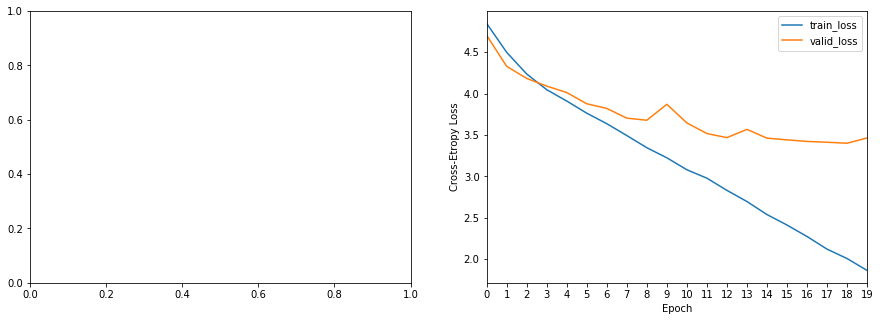

In [54]:

fig, axs = plt.subplots(1, 2, figsize=(15,5))

axs[1] = train_score_df.loc[:,["train_loss", "valid_loss"]].plot(ax=axs[1], xticks=train_score_df.loc[:,"epoch"]-1)

axs[1].set_ylabel("Cross-Etropy Loss")
axs[1].set_xlabel("Epoch")
#plt.savefig("images/report/scratch_val.jpg")

In [5]:
model_scratch.load_state_dict(torch.load('model_scratch.pt'))

<All keys matched successfully>

In [10]:
model_scratch.conv1

Conv2d(3, 6, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images.  Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 10%.

In [42]:
def test(loaders, model, criterion, use_cuda):

    # monitor test loss and accuracy
    test_loss = 0.
    correct = 0.
    total = 0.

    model.eval()
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the loss
        loss = criterion(output, target)
        # update average test loss 
        test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss.data - test_loss))
        # convert output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        # compare predictions to true label
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        total += data.size(0)
            
    print('Test Loss: {:.6f}\n'.format(test_loss))

    print('\nTest Accuracy: %2d%% (%2d/%2d)' % (
        100. * correct / total, correct, total))

# call test function    
#test(loaders_scratch, model_scratch, criterion_scratch, use_cuda)

In [48]:
# call test function    
test(loaders_scratch, model_scratch, criterion_scratch, use_cuda)

Test Loss: 3.374201


Test Accuracy: 20% (169/836)


This is just enough to pass, but it is clear that the net has clearly started to overfit already at the 15 epoch.
If I was to develope a production model from scratch, I would start from from further data augmentation, dropouts, change model architecture etc.

---
<a id='step4'></a>
## Step 4: Create a CNN to Classify Dog Breeds (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify dog breed from images.  Your CNN must attain at least 60% accuracy on the test set.

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/master/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively). 

If you like, **you are welcome to use the same data loaders from the previous step**, when you created a CNN from scratch.

In [29]:
## TODO: Specify data loaders

import os
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler

from torch.utils.data import DataLoader
import torchvision.transforms as transforms

data_transform = {
    
    "train" : transforms.Compose([            
    transforms.Resize(256),                    
    transforms.CenterCrop(224),    
    transforms.RandomHorizontalFlip(),
    transforms.RandomAffine(degrees=0.3),
    transforms.ToTensor(),           
    transforms.Normalize(                
        mean=[0.485, 0.456, 0.406],             
        std=[0.229, 0.224, 0.225]
    )]),

    "test" : transforms.Compose([            
    transforms.Resize(256),                    
    transforms.CenterCrop(224),                 
    transforms.ToTensor(),           
    transforms.Normalize(                
        mean=[0.485, 0.456, 0.406],             
        std=[0.229, 0.224, 0.225]
    )]),
   "valid" : transforms.Compose([            
    transforms.Resize(256),                    
    transforms.CenterCrop(224),                 
    transforms.ToTensor(),           
    transforms.Normalize(                
        mean=[0.485, 0.456, 0.406],             
        std=[0.229, 0.224, 0.225]
    )])}

dog_img_path = 'dogImages/'

dog_datasets = {x: torchvision.datasets.ImageFolder(os.path.join(dog_img_path, x), 
                                                    transform=data_transform[x])
                                                    for x in ["train", "test", "valid"]}

loaders_transfer = {x: DataLoader(dog_datasets[x], batch_size=10, shuffle=True, num_workers=4) 
               for x in ["train", "test", "valid"]}


classes = dog_datasets["train"].classes
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
dataset_sizes = {x: len(dog_datasets[x]) for x in ["train", "test", "valid"]}


### (IMPLEMENTATION) Model Architecture

Use transfer learning to create a CNN to classify dog breed.  Use the code cell below, and save your initialized model as the variable `model_transfer`.

In [30]:
import torchvision.models as models
import torch.nn as nn

## TODO: Specify model architecture 

# Using ResNeXt101 as fixed feature extractor
model_transfer = torchvision.models.resnet18(pretrained=True)

# Freezing pretrained model
for param in model_transfer.parameters():
    param.requires_grad = False

# Adding Fully Connected layer for dog breed classification
num_ftrs = model_transfer.fc.in_features
model_transfer.fc = nn.Linear(num_ftrs, 133) 

if use_cuda:
    model_transfer = model_transfer.cuda()

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /home/le-roy/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answer:__ 

Basically there are two options for transfer learning: fine-tune all layers of existing pretrained model given new data, or "freeze" params and add one Linear layer to predict classes in your data. Since we have a relatively small dataset, and the original ImageNet dataset contains a lot of different dog breeds already, picking the first technique could lead to overfitting. 

In terms of the model selection, I went with ResNet18 due to its training time, since I do not have CUDA on my laptop:) Otherwise I would pick something more advanced like ResNext101 or DenseNet etc. 

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/master/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/master/optim.html).  Save the chosen loss function as `criterion_transfer`, and the optimizer as `optimizer_transfer` below.

In [31]:
criterion_transfer = nn.CrossEntropyLoss()
optimizer_transfer = optim.SGD(model_transfer.parameters(), lr=0.001, momentum=0.9)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_transfer.pt'`.

In [37]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
from tqdm import tqdm

train_losses = []
valid_losses = []

def train(n_epochs, loaders, model, optimizer, criterion, use_cuda, save_path):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf 
    
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        
        ###################
        # train the model #
        ###################
        model.train()
        for batch_idx, (data, target) in tqdm(enumerate(loaders['train']), desc="Train", total=len(loaders['train']), position=0):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## find the loss and update the model parameters accordingly
            ## record the average training loss, using something like
            ## train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
            
            optimizer.zero_grad() # zero the parameter gradients 
            
            # forward + backward + optimize
            pred = model(data)
            loss = criterion(pred, target)
            loss.backward()  # backpropagate errors - calculate gradients wrt params
            optimizer.step() # update params
            
            train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
            
            
        ######################    
        # validate the model #
        ######################
        model.eval()
        for batch_idx, (data, target) in tqdm(enumerate(loaders['valid']), desc="Valid", total=len(loaders['valid']), position=0):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## update the average validation loss
            
            pred = model(data)
            loss = criterion(pred, target)
            valid_loss = valid_loss + ((1 / (batch_idx + 1)) * (loss.data - valid_loss))
                        
            #print(f"Epoch: {epoch} \t Train loss: {train_loss:.4f} \t Valid loss: {valid_loss:.4f}")


            
        # print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, 
            train_loss,
            valid_loss
            ))
        train_losses.append(train_loss)
        valid_losses.append(valid_loss)

        
        ## TODO: save the model if validation loss has decreased
        
        if valid_loss < valid_loss_min:
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss
            
    # return trained model
    return model


In [38]:
n_epochs = 10

# train the model
model_transfer = train(n_epochs, loaders_transfer, model_transfer, optimizer_transfer, criterion_transfer, use_cuda, 'model_transfer.pt')

# load the model that got the best validation accuracy (uncomment the line below)
#model_transfer.load_state_dict(torch.load('model_transfer.pt'))

Valid: 100%|██████████| 84/84 [01:18<00:00,  1.07it/s]

Epoch: 1 	Training Loss: 1.686759 	Validation Loss: 1.140038



Valid: 100%|██████████| 84/84 [01:10<00:00,  1.19it/s]


Epoch: 2 	Training Loss: 1.268201 	Validation Loss: 0.906886


Valid: 100%|██████████| 84/84 [01:30<00:00,  1.08s/it]


Epoch: 3 	Training Loss: 1.065474 	Validation Loss: 0.800735


Valid: 100%|██████████| 84/84 [01:12<00:00,  1.16it/s]


Epoch: 4 	Training Loss: 0.920021 	Validation Loss: 0.734773


Valid: 100%|██████████| 84/84 [01:28<00:00,  1.05s/it]


Epoch: 5 	Training Loss: 0.826467 	Validation Loss: 0.685949


Valid: 100%|██████████| 84/84 [01:38<00:00,  1.17s/it]


Epoch: 6 	Training Loss: 0.764538 	Validation Loss: 0.659974


Valid: 100%|██████████| 84/84 [01:16<00:00,  1.10it/s]


Epoch: 7 	Training Loss: 0.723437 	Validation Loss: 0.656318


Valid: 100%|██████████| 84/84 [01:14<00:00,  1.13it/s]


Epoch: 8 	Training Loss: 0.670126 	Validation Loss: 0.632076


Valid: 100%|██████████| 84/84 [01:15<00:00,  1.11it/s]


Epoch: 9 	Training Loss: 0.621858 	Validation Loss: 0.610421


Valid: 100%|██████████| 84/84 [01:15<00:00,  1.11it/s]


Epoch: 10 	Training Loss: 0.595384 	Validation Loss: 0.593539


In [43]:
t_train = """
Epoch: 1 	Training Loss: 1.686759 	Validation Loss: 1.140038
Epoch: 2 	Training Loss: 1.268201 	Validation Loss: 0.906886
Epoch: 3 	Training Loss: 1.065474 	Validation Loss: 0.800735
Epoch: 4 	Training Loss: 0.920021 	Validation Loss: 0.734773
Epoch: 5 	Training Loss: 0.826467 	Validation Loss: 0.685949
Epoch: 6 	Training Loss: 0.764538 	Validation Loss: 0.659974
Epoch: 7 	Training Loss: 0.723437 	Validation Loss: 0.656318
Epoch: 8 	Training Loss: 0.670126 	Validation Loss: 0.632076
Epoch: 9 	Training Loss: 0.621858 	Validation Loss: 0.610421
Epoch: 10 	Training Loss: 0.595384 	Validation Loss: 0.593539
"""

tf_tscore = [t.split("\t") for t in t_train.split("\n")][1:-1]
tf_tscore = [[float(t.split(": ")[1]) for t in line] for line in tf_tscore]

tf_score_df = pd.DataFrame(tf_tscore, columns=["epoch", "train_loss", "valid_loss"])

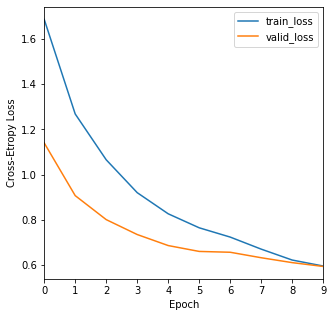

In [45]:


ax = tf_score_df.loc[:,["train_loss", "valid_loss"]].plot(figsize=(5,5), xticks=tf_score_df.loc[:,"epoch"]-1)

ax.set_ylabel("Cross-Etropy Loss")
ax.set_xlabel("Epoch")
plt.savefig("images/report/transfer_val.jpg")

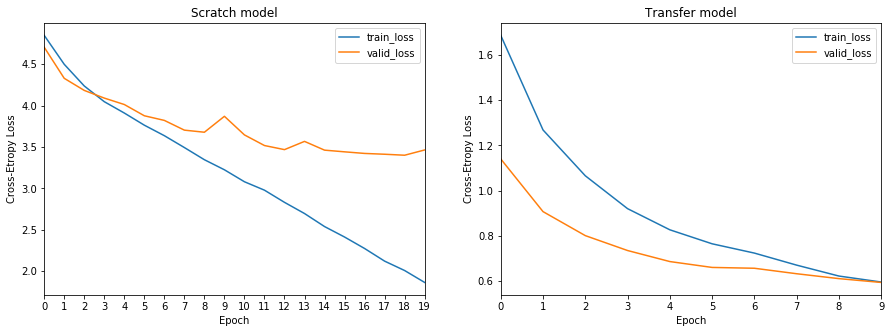

In [59]:
fig, axs = plt.subplots(1, 2, figsize=(15,5))

axs[0] = train_score_df.loc[:,["train_loss", "valid_loss"]].plot(ax=axs[0], xticks=train_score_df.loc[:,"epoch"]-1)

axs[0].set_ylabel("Cross-Etropy Loss")
axs[0].set_xlabel("Epoch")
axs[0].set_title("Scratch model")


axs[1] = tf_score_df.loc[:,["train_loss", "valid_loss"]].plot(ax = axs[1], xticks=tf_score_df.loc[:,"epoch"]-1)

axs[1].set_ylabel("Cross-Etropy Loss")
axs[1].set_xlabel("Epoch")
axs[1].set_title("Transfer model")

fig.savefig("images/report/train_val.jpg")

In [39]:
model_transfer.load_state_dict(torch.load('model_transfer.pt'))

<All keys matched successfully>

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images. Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 60%.

In [49]:
test(loaders_transfer, model_transfer, criterion_transfer, use_cuda)

Test Loss: 0.596198


Test Accuracy: 81% (684/836)


### (IMPLEMENTATION) Predict Dog Breed with the Model

Write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan hound`, etc) that is predicted by your model.  

In [120]:
### TODO: Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.

from PIL import Image
import torchvision.transforms as transforms

# list of class names by index, i.e. a name can be accessed like class_names[0]
class_names = [item[4:].replace("_", " ") for item in dog_datasets['train'].classes]

def predict_breed_transfer(img_path, model, class_names):
    """
        Returns: 
            - breed name
            - class index
            - full class name
    """
    
    # load the image and return the predicted breed
    
       # Step 0. Load file
    img_raw = Image.open(img_path)
    img_np = np.asarray(img_raw).transpose(2,0,1) # reordering dimensions to [channel, h, w]
    t = torch.tensor(img_np, dtype=torch.float32) # convert to torch tensor
    
    """ Step 1. Transform PIL image using following manipulations:
        - Resize to 256x256
        - Crop at center to 224x224
        - Normalize using mean = [0.485, 0.456, 0.406] and std = [0.229, 0.224, 0.225]
    """
    transform = transforms.Compose([            
        transforms.Resize(256),                    
        transforms.CenterCrop(224),                 
        transforms.ToTensor(),           
        transforms.Normalize(                
            mean=[0.485, 0.456, 0.406],             
            std=[0.229, 0.224, 0.225]
        )])

    t = transform(img_raw)

    t = t.unsqueeze(0) # setting tensor te required dimensions [batch, channel, h, w]
    
    # Step 2. Obtaining predicted class index
    idx = torch.argmax(model(t))
    
    return class_names[idx], idx.item(), classes[idx]

Irish terrier


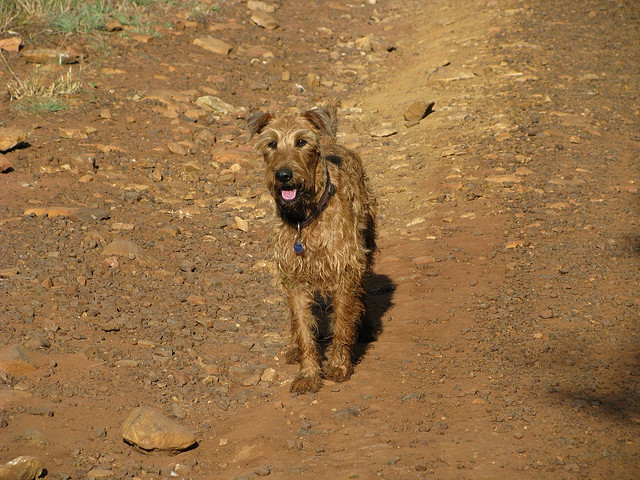

In [122]:
pred, *_ = predict_breed_transfer(dog_files_short[0], model_transfer, class_names)
print(pred)
Image.open(dog_files_short[0])

American staffordshire terrier


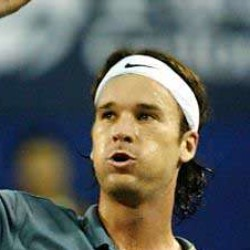

In [123]:
pred, *_ = predict_breed_transfer(human_files_short[0], model_transfer, class_names)
print(pred)
Image.open(human_files_short[0])

---
<a id='step5'></a>
## Step 5: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `dog_detector` functions developed above.  You are __required__ to use your CNN from Step 4 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](images/sample_human_output.png)


### (IMPLEMENTATION) Write your Algorithm

In [196]:
### TODO: Write your algorithm.
### Feel free to use as many code cells as needed.

def run_app(img_path):
    ## handle cases for a human face, dog, and neither
    
    whoami = None
    
    if dog_detector(img_path):
        whoami = "doggo"
        
    elif face_detector(img_path):
        whoami = "hooman"
        
    img = np.asarray(Image.open(img_path))
    
    if whoami:
        # predict breed
        breed, idx, breed_folder = predict_breed_transfer(img_path, model_transfer, class_names)
        
        # construct subplot
        fig, axs = plt.subplots(1,2, figsize=(10,5))
        
        axs[0].set_title(f"Hello, {whoami}!", fontsize=12)
        axs[0].imshow(img)
        axs[0].set_xlabel(f"\nYou look like {breed}.", fontsize=12)
        
        # fetch image of resembling dog breed
        PATH = "dogImages/train/"
        breed_example = np.random.choice(os.listdir(PATH + breed_folder))
        ex_path = os.path.join(PATH, breed_folder, breed_example)
        axs[1].imshow(np.asarray(Image.open(ex_path)))
        
        plt.savefig("images/"+img_path.split("/")[1])
        
    else:
        plt.suptitle("Sorry, do I know you?:)", fontsize=12)
        plt.imshow(img)
        
    plt.show()


---
<a id='step6'></a>
## Step 6: Test Your Algorithm

In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that _you_ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test Your Algorithm on Sample Images!

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ (Three possible points for improvement)

- Increase dataset size. 668 images per epoch is a small dataset for such a high class sparsity. 
- Additionally apply further data augmentation techniques to the training data. For example, I have replaced the initially selected random crop with center crop, because for some images dog faces were not in the picture, which had negative effect on model performace. 
- Select more advanced model for transfer learning. I went with ResNet18 mainly due to the smaller training time (10m per epoch). A more advanced base model like i.e. ResNeXT101 could potentially improve overall performance
- In terms of delivery, this algo seems to me like a fun android app material:)

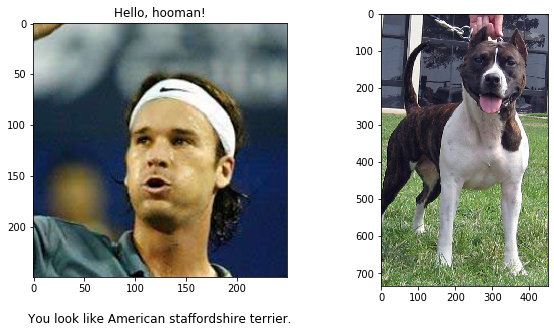

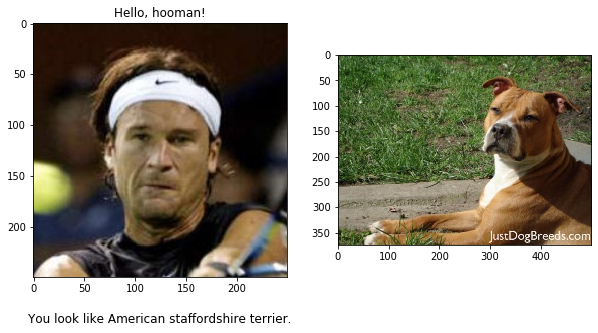

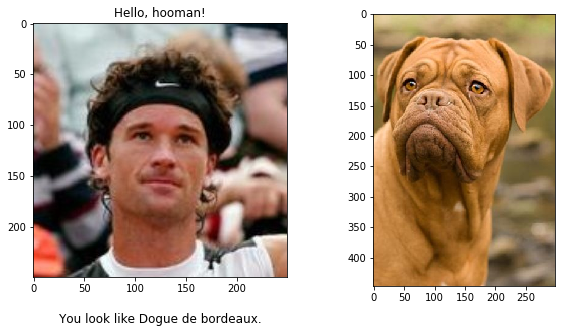

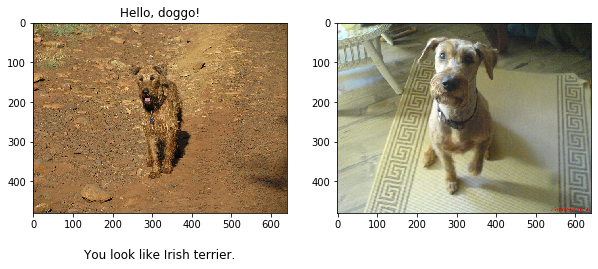

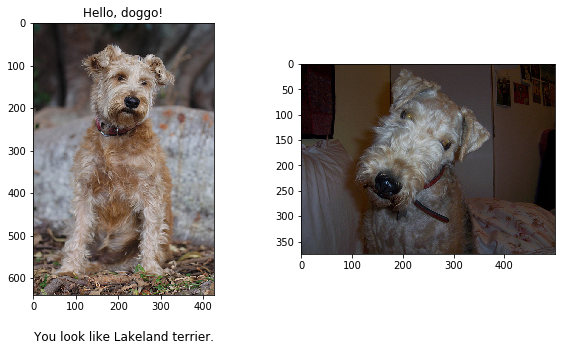

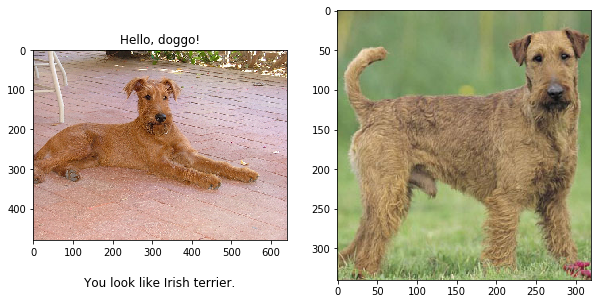

In [150]:
## TODO: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.

## suggested code, below
for file in np.hstack((human_files[:3], dog_files[:3])):
    run_app(file)

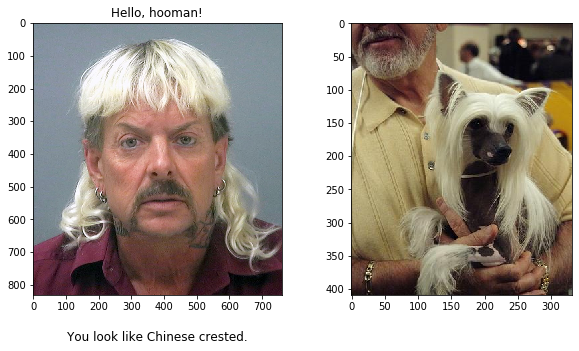

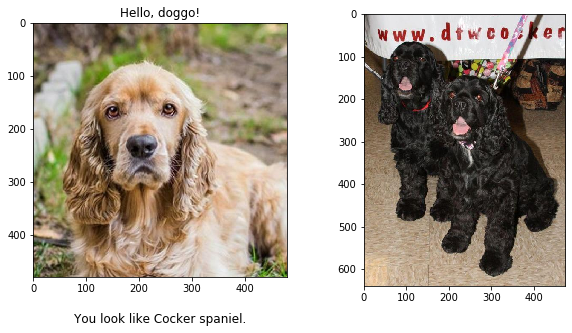

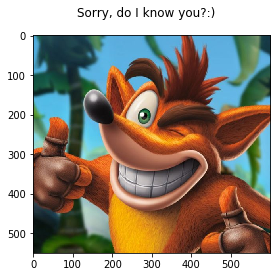

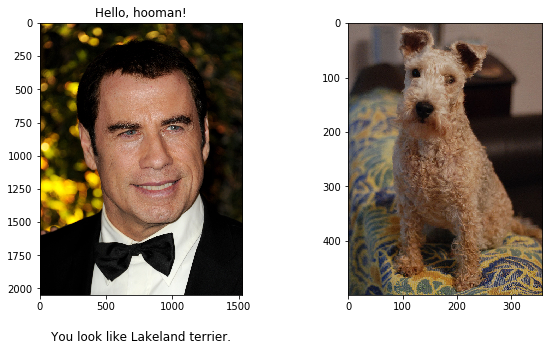

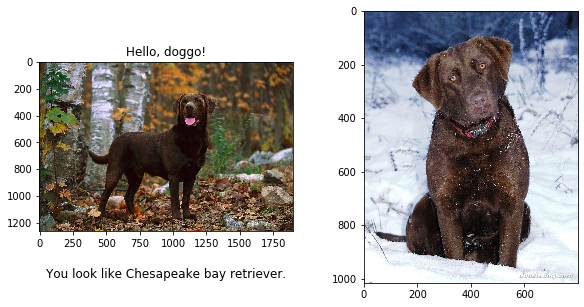

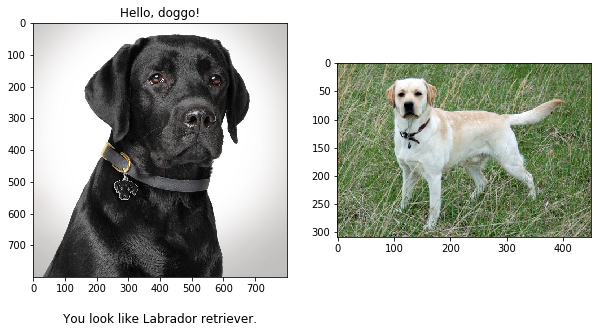

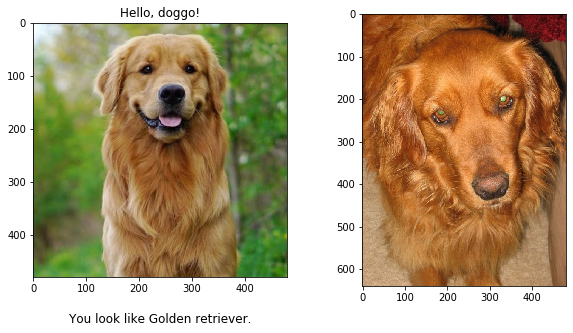

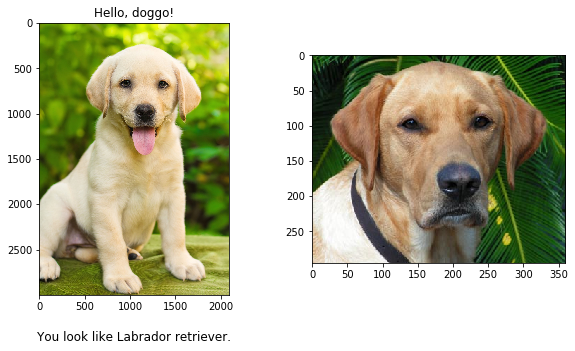

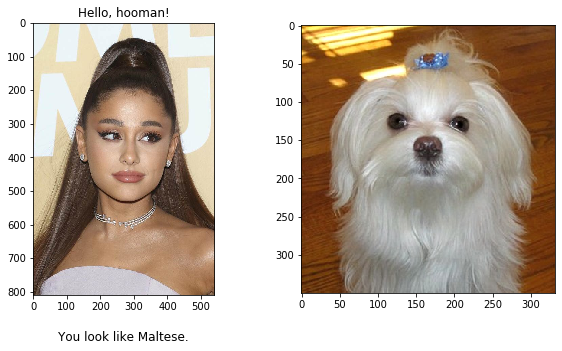

In [194]:
img_test = os.listdir("img_test/")

for file in [os.path.join("img_test", img) for img in img_test]:
    run_app(file)